# Understanding Noise in Text-to-Image Generation: An Explainable AI Perspective

## Overview and Motivation

**What role does noise play in AI image generation?** This is the central question we'll explore in this notebook.

Diffusion models have revolutionized image generation, but their inner workings remain somewhat mysterious. Unlike traditional generative models, diffusion models **learn to understand and manipulate noise** to create images. This raises fascinating questions from an **explainable AI (xAI)** perspective:

- **How does noise encode semantic information?** Can we interpret what the model "sees" in noise at different stages?
- **Which timesteps are most critical?** When does structure emerge from randomness?
- **How does conditioning affect noise prediction?** What happens to the noise when we guide generation with text?

### Our Approach

In this notebook, we combine two powerful technologies:

1. **Denoising Diffusion Probabilistic Models (DDPM)** - Models that learn to generate by predicting and removing noise
2. **CLIP (Contrastive Language-Image Pre-Training)** - A model that aligns text and image representations

But our focus goes beyond just building a text-to-image system. We aim to:

✨ **Understand the role of noise** in the generation process  
✨ **Interpret what the model learns** about noise at different timesteps  
✨ **Quantify the effect of guidance** on noise prediction  
✨ **Visualize the denoising trajectory** to make the "black box" more transparent

### What You'll Learn

By the end of this notebook, you'll understand:
- How diffusion models learn to predict noise (and why this enables generation)
- How CLIP embeddings condition noise prediction for text-guided generation
- **How to analyze and interpret the noise** at different stages of generation
- **How to quantify the importance** of different denoising steps
- How guidance strength affects the noise prediction process

### The Main Analysis

The computational work focuses on **training a CLIP-conditioned diffusion model on Tiny ImageNet**, followed by **detailed analysis of the noise patterns** and their role in controlled image generation. This explainability perspective helps demystify how these powerful models actually work.

## 1. Diffusion Models: Noise as a Generative Tool

Diffusion models represent a paradigm shift in how we think about image generation. Instead of directly generating pixels, they **learn to understand and manipulate noise**.

**The Central Insight**: If we can accurately predict what noise was added to an image, we can reverse the process—starting from pure noise and progressively removing it to create new images.

### 1.1 The Forward Diffusion Process: Systematically Adding Noise

The forward process gradually corrupts an image with Gaussian noise over $T$ timesteps. At each step $t$, we add noise controlled by a variance schedule $\beta_t$:

$$q(x_t | x_{t-1}) = \mathcal{N}(x_t; \sqrt{1-\beta_t}x_{t-1}, \beta_t I)$$

After many steps, the original image $x_0$ becomes indistinguishable from pure noise $x_T \sim \mathcal{N}(0, I)$. 

**Key property**: We can jump directly to any timestep without computing intermediate steps:

$$x_t = \sqrt{\bar{\alpha}_t} x_0 + \sqrt{1-\bar{\alpha}_t} \epsilon$$

where $\alpha_t = 1 - \beta_t$, $\bar{\alpha}_t = \prod_{i=1}^{t} \alpha_i$, and $\epsilon \sim \mathcal{N}(0, I)$ is the noise.

**xAI Perspective**: This deterministic relationship means that for any noisy image $x_t$, there's a specific noise pattern $\epsilon$ that links it to the original $x_0$. The model's job is to **learn to recognize and predict these noise patterns**.

### 1.2 The Reverse Diffusion Process: Learning to Predict Noise

Here's where the magic happens. A neural network $\epsilon_\theta(x_t, t)$ learns to **predict the noise** $\epsilon$ that was added to create $x_t$ from $x_0$.

Why predict noise instead of the image directly?
- **Noise is more structured** than it appears—it encodes information about the image
- Predicting noise is **easier to learn** (stable gradients)
- The same noise predictor works **across all timesteps**

Once trained, we generate images by:
1. Starting with random noise $x_T \sim \mathcal{N}(0, I)$
2. Iteratively predicting and removing noise: 

$$x_{t-1} = \frac{1}{\sqrt{\alpha_t}}(x_t - \frac{1-\alpha_t}{\sqrt{1-\bar{\alpha}_t}}\epsilon_\theta(x_t, t)) + \sigma_t z$$

where $z \sim \mathcal{N}(0, I)$ and $\sigma_t$ controls stochasticity.

**xAI Perspective**: Each denoising step removes a predicted noise pattern. By analyzing $\epsilon_\theta(x_t, t)$ at different timesteps, we can understand **when and how** semantic structure emerges.

### 1.3 Training Objective: Noise Prediction Error

The model is trained with a simple objective—minimize the difference between predicted and actual noise:

$$L = \mathbb{E}_{x_0, \epsilon, t} \left[ ||\epsilon - \epsilon_\theta(x_t, t)||^2 \right]$$

**xAI Perspective**: This loss tells us how well the model "understands" noise at each timestep. By analyzing this loss across timesteps and conditioning, we can identify:
- Which timesteps are hardest to denoise (largest errors)
- How conditioning changes noise prediction patterns
- What visual features emerge at different noise levels

**Key References:**
- [Denoising Diffusion Probabilistic Models (Ho et al., 2020)](https://arxiv.org/abs/2006.11239) - The foundational DDPM paper
- [Understanding Diffusion Models (Luo, 2022)](https://arxiv.org/abs/2208.11970) - Comprehensive mathematical overview

## 2. CLIP: Semantic Guidance Through Aligned Embeddings

[CLIP (Contrastive Language-Image Pre-Training)](https://arxiv.org/abs/2103.00020) by OpenAI learns to connect images and text in a shared embedding space. This alignment is crucial for understanding **how semantic information can guide noise prediction**.

### 2.1 How CLIP Works

CLIP consists of two encoders that map to the same 512-dimensional space:
- **Image Encoder**: Processes images → 512D embeddings
- **Text Encoder**: Processes text → 512D embeddings

The key training objective is **contrastive learning**: maximize similarity between correct (image, text) pairs while minimizing similarity with incorrect pairs.

**Result**: Images and their textual descriptions end up close together in embedding space.

### 2.2 Why CLIP Matters for Noise Prediction

CLIP provides a way to **condition noise prediction** on semantic content:

1. **Semantic Alignment**: CLIP embeddings capture semantic meaning—similar concepts have similar embeddings
2. **Continuous Conditioning**: Unlike discrete labels, CLIP embeddings form a continuous space
3. **Natural Language Interface**: Users can describe desired content in plain English

**xAI Perspective**: By conditioning the noise predictor $\epsilon_\theta(x_t, t, c)$ on CLIP embedding $c$, we can ask:
- **How does the model's noise prediction change** when we add text conditioning?
- **What semantic information is encoded** in the noise at different timesteps?
- **Can we visualize the effect** of different prompts on noise patterns?

### 2.3 CLIP in Our Pipeline

We'll use CLIP in two ways:
1. **During Training**: Extract CLIP image embeddings to teach the model what noise patterns correspond to different semantic content
2. **During Generation**: Encode text prompts to guide noise prediction toward desired content

**Key Insight for xAI**: Because CLIP aligns text and images, we can train on image embeddings but test with text embeddings—allowing us to study how linguistic concepts influence noise prediction.

**Key References:**
- [Learning Transferable Visual Models From Natural Language Supervision (Radford et al., 2021)](https://arxiv.org/abs/2103.00020) - The original CLIP paper
- [CLIP GitHub Repository](https://github.com/openai/CLIP) - Official implementation and pre-trained models

## 3. Classifier-Free Guidance: Amplifying Semantic Signal in Noise

Now we address a critical question: **How can we strengthen the influence of text conditioning on noise prediction?**

### 3.1 Conditioning the U-Net on CLIP Embeddings

Our diffusion model uses a U-Net architecture to predict noise, now conditioned on CLIP embeddings:

```python
epsilon = UNet(x_t, t, c)  # Predict noise given image, timestep, and CLIP embedding
```

where:
- `x_t` is the noisy image at timestep t
- `t` is the timestep embedding
- `c` is the CLIP embedding (512-dimensional vector)

The CLIP embedding is incorporated through **scale and shift** operations ([FiLM layers](https://arxiv.org/abs/1709.07871)):

```python
up1 = self.up1(c_emb1 * up0 + t_emb1, down2)  # Modulate features with CLIP
```

**xAI Perspective**: The scale and shift operations allow CLIP embeddings to **modulate the noise prediction** at different feature scales. We can analyze how different text prompts change these modulations.

### 3.2 Classifier-Free Guidance: A Key Technique for Interpretability

During training, we randomly drop CLIP conditioning (set `c = 0`) with ~10% probability. This teaches the model two modes:
- **Conditional**: Predict noise for a specific CLIP embedding
- **Unconditional**: Predict "average" noise without guidance

During generation, we use **classifier-free guidance** ([Ho & Salimans, 2022](https://arxiv.org/abs/2207.12598)):

$$\tilde{\epsilon}_\theta(x_t, c) = (1 + w) \cdot \epsilon_\theta(x_t, c) - w \cdot \epsilon_\theta(x_t, \emptyset)$$

where:
- $\epsilon_\theta(x_t, c)$ is the **conditional** noise prediction (with text guidance)
- $\epsilon_\theta(x_t, \emptyset)$ is the **unconditional** noise prediction (without guidance)
- $w$ is the guidance weight (typically 1-2)

**Interpreting the Formula**:
- The model predicts noise **twice** at each step
- We take the conditional prediction and **push it away** from the unconditional baseline
- This amplifies the effect of the text prompt on noise prediction
- When $w = 0$: Standard conditional generation
- When $w > 0$: Stronger adherence to the text prompt

**xAI Perspective**: This formulation is powerful for interpretability because:
1. **We can visualize the difference** $\Delta\epsilon = \epsilon_\theta(x_t, c) - \epsilon_\theta(x_t, \emptyset)$ to see how text changes noise prediction
2. **We can sweep $w$ values** to quantify how guidance strength affects generation
3. **We can analyze when conditioning matters most** by comparing conditional vs unconditional predictions across timesteps

### 3.3 Training vs. Inference: Setting Up for Analysis

**Training**: 
- Input: Noisy images + CLIP embeddings (randomly dropped 10% of the time)
- Output: Predicted noise
- Objective: Minimize $||\epsilon - \epsilon_\theta(x_t, t, c)||^2$

**Inference (with analysis)**:
1. Encode text prompt: `c = CLIP_text_encoder(prompt)`
2. Start with random noise: `x_T ~ N(0, I)`
3. For each timestep from T to 0:
   - Predict noise **with and without** conditioning
   - Apply classifier-free guidance with weight $w$
   - **[Analysis]** Track noise predictions, differences, and denoising trajectory
   - Denoise one step
4. Return final image and analysis data

**Our Analysis Goals**:
- Quantify which timesteps show the largest difference between conditional and unconditional noise
- Visualize how noise patterns evolve during generation
- Understand when semantic structure emerges from noise

**Key References:**
- [Classifier-Free Diffusion Guidance (Ho & Salimans, 2022)](https://arxiv.org/abs/2207.12598)
- [High-Resolution Image Synthesis with Latent Diffusion Models (Rombach et al., 2022)](https://arxiv.org/abs/2112.10752) - Stable Diffusion

---

## 4. Implementation: Building an Interpretable Text-to-Image System

Now let's put these concepts into practice with an **emphasis on interpretability**. Our implementation includes:

**Core Pipeline**:
1. **Load and Setup CLIP**: Initialize the pre-trained CLIP model for conditioning
2. **Prepare the Dataset**: Use Tiny ImageNet and extract CLIP embeddings (our "noise targets")
3. **Build the U-Net**: Define a diffusion model conditioned on CLIP embeddings
4. **Train the Model**: Learn to predict noise patterns conditioned on semantic content
5. **Analyze Noise Patterns**: Visualize and quantify the role of noise in generation

The main computational work focuses on **training the model** and then **analyzing the learned noise patterns** to understand how text guidance affects generation.

### 4.1 Initial Setup and Libraries

In [1]:
import os
import sys
import random

import csv
import glob
import numpy as np
import torch
import torch.nn.functional as F
from torch.optim import Adam
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader

# Visualization tools
import matplotlib.pyplot as plt
from PIL import Image
from torchvision.utils import save_image, make_grid
from textwrap import wrap

from ddpm_clip.models import UNet, DDPM, sample_w, visualize_diffusion_process
from ddpm_clip.utils import save_animation, generation_image, to_image

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
assert device.type == 'cuda', "CPU not supported, please run on a machine with CUDA"

In [2]:
# OPTIONAL: Set new HOME directory to scratch space for Das6 (I need this)
import getpass

current_user = getpass.getuser()
if current_user == 'ciarella':
    new_home = '/var/scratch/ciarella/xAI'
    os.environ['HOME'] = new_home
    os.makedirs(new_home, exist_ok=True)
    print(f"Changed HOME directory to: {os.environ['HOME']}")
    print("All cache files, PyTorch compilation, and temporary files will now use this location")
else:
    print(f"Running as user '{current_user}' - using default HOME directory: {os.environ['HOME']}")

Changed HOME directory to: /var/scratch/ciarella/xAI
All cache files, PyTorch compilation, and temporary files will now use this location


### 4.2 Loading CLIP

CLIP comes in several variants based on different vision architectures. Let's see what's available:

In [3]:
import clip

clip.available_models()

['RN50',
 'RN101',
 'RN50x4',
 'RN50x16',
 'RN50x64',
 'ViT-B/32',
 'ViT-B/16',
 'ViT-L/14',
 'ViT-L/14@336px']

We'll use **ViT-B/32** (Vision Transformer - Base model with 32x32 patch size), which:
- Is based on the [Vision Transformer architecture](https://arxiv.org/abs/2010.11929)
- Produces **512-dimensional** feature vectors
- Offers a good balance between speed and quality
- These 512 features will be fed into our diffusion model as conditioning

In [4]:
#clean the gpu
import gc
gc.collect()
torch.cuda.empty_cache()

clip_model, clip_preprocess = clip.load("ViT-B/32")
clip_model.eval()
CLIP_FEATURES = 512

### 4.3 Understanding CLIP Encodings

Let's explore how CLIP encodes images and text into the same embedding space.

#### 4.3.1 Image Encodings

CLIP comes with its own preprocessing pipeline that transforms images to the format it expects:

In [5]:
clip_preprocess

Compose(
    Resize(size=224, interpolation=bicubic, max_size=None, antialias=True)
    CenterCrop(size=(224, 224))
    <function _convert_image_to_rgb at 0x7f91e1e26660>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)

Let's load a sample image from the Tiny ImageNet dataset and encode it with CLIP. 

We preprocess the image with `clip_preprocess`, stack it into a batch (CLIP expects batched input), and then encode it to get a 512-dimensional embedding:

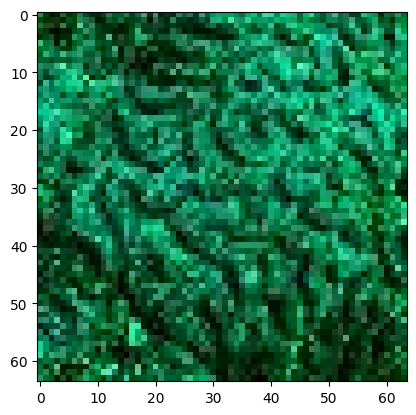

In [6]:
DATA_DIR = "../data/tiny-imagenet-200/train/n01917289/images/"
img_path = DATA_DIR + "n01917289_241.JPEG"
img = Image.open(img_path)
plt.imshow(img)

The output shows the shape `[1, 512]` - one image with 512 features. Each image is now represented as a point in a 512-dimensional space!

In [7]:
clip_imgs = torch.tensor(np.stack([clip_preprocess(img)])).to(device)
clip_imgs.size()
clip_img_encoding = clip_model.encode_image(clip_imgs)
print(clip_img_encoding.size())
#clip_img_encoding

torch.Size([1, 512])


#### 4.3.2 Text Encodings

Now let's encode text descriptions. CLIP uses a tokenizer to convert text into integer sequences:

In [8]:
text_list = [
    "A lush green forest",
    "An emotional sunset",
    "A concert in a theater"
]
text_tokens = clip.tokenize(text_list).to(device)

We pass the tokenized text to CLIP's text encoder to get embeddings in the same 512-dimensional space as images:

In [9]:
clip_text_encodings = clip_model.encode_text(text_tokens).float()
print(clip_text_encodings.size())
#clip_text_encodings

torch.Size([3, 512])


#### 4.3.3 Measuring Similarity with Cosine Distance

To measure how well text describes an image, we compute the **cosine similarity** between their embeddings.

Cosine similarity ranges from -1 (opposite) to 1 (identical). It's computed as the dot product of normalized vectors:

$$\text{similarity} = \frac{X \cdot Y}{||X|| \cdot ||Y||} = \sum_{i=1}^{n} x_i y_i \text{ (when normalized)}$$

Let's normalize both embeddings and compute their similarity:

In [10]:
clip_img_encoding /= clip_img_encoding.norm(dim=-1, keepdim=True)
clip_text_encodings /= clip_text_encodings.norm(dim=-1, keepdim=True)
similarity = (clip_text_encodings * clip_img_encoding).sum(-1)
similarity

tensor([0.2503, 0.1595, 0.1686], device='cuda:0', grad_fn=<SumBackward1>)

Let's test CLIP's understanding with multiple images and descriptions. We'll compute similarity scores for all combinations:

In [11]:
img_paths = [
    "../data/tiny-imagenet-200/train/n01917289/images/n01917289_241.JPEG",
    "../data/tiny-imagenet-200/train/n09428293/images/n09428293_75.JPEG",
    "../data/tiny-imagenet-200/train/n02788148/images/n02788148_11.JPEG",
]

imgs = [Image.open(path) for path in img_paths]

In [12]:

def get_img_encodings(imgs):
    processed_imgs = [clip_preprocess(img) for img in imgs]
    clip_imgs = torch.tensor(np.stack(processed_imgs)).to(device)
    clip_img_encodings = clip_model.encode_image(clip_imgs)
    return clip_img_encodings

clip_img_encodings = get_img_encodings(imgs)

In [13]:
text_list = [
    "A lush green forest",
    "An emotional sunset",
    "A concert in a theater"
]
text_tokens = clip.tokenize(text_list).to(device)
clip_text_encodings = clip_model.encode_text(text_tokens).float()

To compare all text-image pairs, we use `repeat` and `repeat_interleave` to create all combinations:
- `repeat`: Duplicates entire tensors
- `repeat_interleave`: Duplicates individual elements

This creates a similarity matrix where entry (i, j) shows how well text i matches image j:

In [14]:
clip_img_encodings /= clip_img_encodings.norm(dim=-1, keepdim=True)
clip_text_encodings /= clip_text_encodings.norm(dim=-1, keepdim=True)

n_imgs = len(imgs)
n_text = len(text_list)

repeated_clip_text_encodings = clip_text_encodings.repeat(n_imgs, 1)
repeated_clip_img_encoding = clip_img_encodings.repeat_interleave(n_text, dim=0)

similarity = (repeated_clip_text_encodings * repeated_clip_img_encoding).sum(-1)
similarity = torch.unflatten(similarity, 0, (n_text, n_imgs))

Let's visualize the similarity matrix. Ideally, the diagonal (matching pairs) should have high scores (bright yellow):

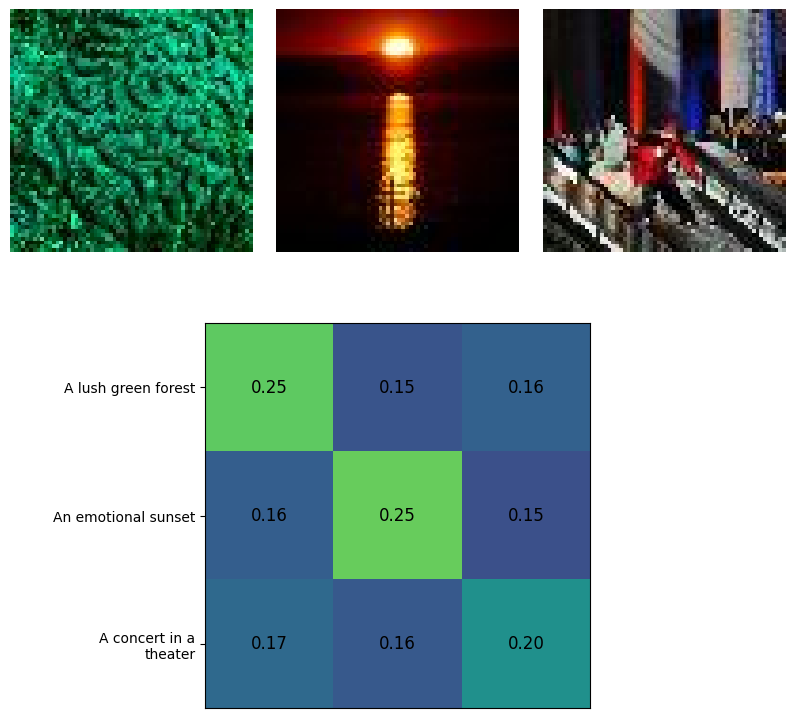

In [15]:
fig = plt.figure(figsize=(10, 10))
gs = fig.add_gridspec(2, 3, wspace=.1, hspace=0)

for i, img in enumerate(imgs):
    ax = fig.add_subplot(gs[0, i])
    ax.axis("off")
    plt.imshow(img)

ax = fig.add_subplot(gs[1, :])
plt.imshow(similarity.detach().cpu().numpy().T, vmin=0.1, vmax=0.3)

labels = [ '\n'.join(wrap(text, 20)) for text in text_list ]
plt.yticks(range(n_text), labels, fontsize=10)
plt.xticks([])

for x in range(similarity.shape[1]):
    for y in range(similarity.shape[0]):
        plt.text(x, y, f"{similarity[x, y]:.2f}", ha="center", va="center", size=12)

---

## 5. Dataset Preparation: Tiny ImageNet with CLIP Embeddings

### 5.1 The Key Insight: Using CLIP Image Embeddings as Labels

Do we need text descriptions for each training image? No!

Traditional text-to-image models require (image, caption) pairs. But CLIP was trained to align images and text in the same space. If we:
1. Extract CLIP image embeddings from our dataset
2. Train the diffusion model to generate images conditioned on these embeddings
3. At inference time, use CLIP **text** embeddings

Then the model should work because CLIP ensures text and image embeddings are aligned!

This means we can train on image datasets **without any text annotations** and still get text-to-image generation for free!

### 5.2 Loading Tiny ImageNet

We'll use a subset of [Tiny ImageNet](http://cs231n.stanford.edu/tiny-imagenet-200.zip), which contains 200 classes of 64x64 images:

In [16]:
# Point this to your extracted dataset root
dataset_root = "../data/tiny-imagenet-200"

# Collect all image files (train + val; skip test if no labels needed)
train_paths = glob.glob(f"{dataset_root}/train/*/images/*.JPEG")
val_paths = glob.glob(f"{dataset_root}/val/images/*.JPEG")

# Combine them ?
data_paths = train_paths # + val_paths

ndata = 100000
print(f"Found {len(data_paths)} total images, but using only {ndata}")

# To save time, I only use a subset of the (shuffled) data
random.seed(11)
# Add a flag to prevent re-shuffling
if 'data_paths_shuffled' not in globals():
    print("Shuffling data for the first time...")
    random.shuffle(data_paths)
    data_paths = data_paths[:ndata]
    data_paths_shuffled = True
else:
    print("Data already shuffled, using existing order")
print(data_paths[:5])  # sanity check

Found 100000 total images, but using only 100000
Shuffling data for the first time...
['../data/tiny-imagenet-200/train/n01945685/images/n01945685_61.JPEG', '../data/tiny-imagenet-200/train/n02823428/images/n02823428_203.JPEG', '../data/tiny-imagenet-200/train/n07768694/images/n07768694_27.JPEG', '../data/tiny-imagenet-200/train/n09332890/images/n09332890_479.JPEG', '../data/tiny-imagenet-200/train/n02206856/images/n02206856_312.JPEG']


### 5.3 Preprocessing: Extracting CLIP Embeddings

This is the most computationally expensive preprocessing step. For each image in our dataset, we:
1. Load and preprocess the image
2. Pass it through CLIP's image encoder
3. Store the resulting 512-dimensional embedding in a CSV file

**Note**: This runs in batches for efficiency and supports resuming if interrupted. Already processed images are skipped.

In [17]:
csv_path = 'clip.csv'

# Version that skips already processed images
import time
import os

batch_size = 64   # Larger batch size for better GPU utilization

# Check if CSV exists and load existing paths
existing_paths = set()
if os.path.exists(csv_path):
    print(f"Found existing CSV file: {csv_path}")
    with open(csv_path, 'r', newline='') as csvfile:
        reader = csv.reader(csvfile, delimiter=',')
        for row in reader:
            if row:  # Skip empty rows
                existing_paths.add(row[0])
    print(f"Found {len(existing_paths)} already processed images")
else:
    print(f"Creating new CSV file: {csv_path}")

# Filter out already processed paths
remaining_paths = [path for path in data_paths if path not in existing_paths]
print(f"Processing {len(remaining_paths)} new images (skipping {len(existing_paths)} already done)")

if len(remaining_paths) == 0:
    print("All images already processed!")
else:
    all_rows = []
    start_time = time.time()

    for batch_start in range(0, len(remaining_paths), batch_size):
        batch_end = min(batch_start + batch_size, len(remaining_paths))
        batch_paths = remaining_paths[batch_start:batch_end]
        
        # Load and preprocess batch of images (sequential, no additional preprocessing)
        batch_imgs = []
        valid_paths = []
        
        # First prepocess all images in the batch
        for path in batch_paths:
            try:
                img = Image.open(path).convert('RGB')
                # Use CLIP's standard preprocessing without additional resizing
                processed_img = clip_preprocess(img)
                batch_imgs.append(processed_img)
                valid_paths.append(path)
            except Exception as e:
                print(f"Error processing {path}: {e}")
                continue
        
        # Then encode them in a single forward pass
        if batch_imgs:
            # Process entire batch at once
            clip_imgs_batch = torch.stack(batch_imgs).to(device)
            
            with torch.no_grad():  # Save memory during inference
                labels_batch = clip_model.encode_image(clip_imgs_batch)
            
            # Convert to lists and store
            for path, label in zip(valid_paths, labels_batch):
                all_rows.append([path] + label.cpu().tolist())
            
            # Clear GPU memory periodically
            if (batch_start // batch_size + 1) % 20 == 0:
                torch.cuda.empty_cache()
        
        # Progress update with timing
        if (batch_start // batch_size + 1) % 10 == 0:
            elapsed = time.time() - start_time
            rate = batch_end / elapsed
            remaining = (len(remaining_paths) - batch_end) / rate if rate > 0 else 0
            print(f"Processed {batch_end}/{len(remaining_paths)} new images... "
                  f"Rate: {rate:.1f} imgs/sec, ETA: {remaining:.0f}s")

    # Append new rows to existing CSV file
    if all_rows:
        print(f"Appending {len(all_rows)} new entries to CSV...")
        with open(csv_path, 'a', newline='') as csvfile:
            writer = csv.writer(csvfile, delimiter=',')
            writer.writerows(all_rows)
        
        total_time = time.time() - start_time
        print(f"Completed! Processed {len(all_rows)} new images in {total_time:.1f}s")
        print(f"Average rate: {len(all_rows)/total_time:.1f} images/second")
    
    print(f"Total images in dataset: {len(existing_paths) + len(all_rows)}")
    print(f"CSV saved to: {csv_path}")

Found existing CSV file: clip.csv


Found 100000 already processed images
Processing 0 new images (skipping 100000 already done)
All images already processed!


### 5.4 Data Augmentation and Transformations

We define two sets of transformations:

**Pre-transforms** (applied once when loading):
- Resize to 32x32
- Convert to tensor
- Normalize to [-1, 1] (diffusion models work better in this range)

**Random transforms** (applied on-the-fly during training):
- Random crop (data augmentation)
- Random horizontal flip (data augmentation)

This increases effective dataset size and improves generalization:

In [18]:
IMG_CH = 3
IMG_SIZE = 32
BATCH_SIZE = 16
INPUT_SIZE = (IMG_CH, IMG_SIZE, IMG_SIZE)

pre_transforms = [
    transforms.Resize(IMG_SIZE),
    transforms.ToTensor(),  # Scales data into [0,1]
    transforms.Lambda(lambda t: (t * 2) - 1)  # Scale between [-1, 1]
]
pre_transforms = transforms.Compose(pre_transforms)
random_transforms = [
    transforms.RandomCrop(IMG_SIZE),
    transforms.RandomHorizontalFlip(),
]
random_transforms = transforms.Compose(random_transforms)

### 5.5 Custom Dataset Class

Our dataset loads preprocessed CLIP embeddings from the CSV and stores both images and embeddings on GPU for fast training:

- `preprocessed_clip=True`: Uses pre-computed CLIP embeddings (faster)
- `preprocessed_clip=False`: Computes CLIP embeddings on-the-fly (slower but more accurate with augmentations) (Not tested)

In [19]:
class MyDataset(Dataset):
    def __init__(self, csv_path, preprocessed_clip=True):
        self.imgs = []
        self.preprocessed_clip = preprocessed_clip
        if preprocessed_clip:
            self.labels = torch.empty(
                len(data_paths), CLIP_FEATURES, dtype=torch.float, device=device
            )
        
        with open(csv_path, newline='') as csvfile:
            reader = csv.reader(csvfile, delimiter=',')
            for idx, row in enumerate(reader):
                img = Image.open(row[0]).convert('RGB')  # Ensures all images are 3-channel RGB
                self.imgs.append(pre_transforms(img).to(device))
                if preprocessed_clip:
                    label = [float(x) for x in row[1:]]
                    self.labels[idx, :] = torch.FloatTensor(label).to(device)

    def __getitem__(self, idx):
        img = random_transforms(self.imgs[idx])
        if self.preprocessed_clip:
            label = self.labels[idx]
        else:
            batch_img = img[None, :, :, :]
            encoded_imgs = clip_model.encode_image(clip_preprocess(batch_img))
            label = encoded_imgs.to(device).float()[0]
        return img, label

    def __len__(self):
        return len(self.imgs)

In [20]:
train_data = MyDataset(csv_path, preprocessed_clip=True)
dataloader = DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)

---

## 6. The U-Net Architecture

### 6.1 CLIP-Conditioned U-Net

Our U-Net predicts noise in images, conditioned on both timestep `t` and CLIP embedding `c`.

**Key architectural features**:

1. **Time Embedding**: Sinusoidal position embeddings convert timestep into a continuous representation
   ```python
   self.sinusoidaltime = SinusoidalPositionEmbedBlock(t_embed_dim)
   ```

2. **CLIP Conditioning**: The 512-dimensional CLIP embedding is projected and integrated at multiple scales
   ```python
   self.c_embed1 = EmbedBlock(c_embed_dim, up_chs[0])  # c_embed_dim = 512
   self.c_embed2 = EmbedBlock(c_embed_dim, up_chs[1])
   ```

3. **Scale and Shift Modulation**: CLIP embeddings modulate features via multiplication and addition
   ```python
   up1 = self.up1(c_emb1 * up0 + t_emb1, down2)
   ```

4. **Context Masking**: During training, `c_mask` randomly zeros out CLIP embeddings (for classifier-free guidance)
   ```python
   c = c * c_mask  # Randomly drop conditioning
   ```

The full U-Net implementation is in `unet.py`. Let's initialize it:

In [21]:
T = 400
B_start = 0.0001
B_end = 0.02
B = torch.linspace(B_start, B_end, T).to(device)

ddpm = DDPM(B, device)
model = UNet(
    T, IMG_CH, IMG_SIZE, down_chs=(256, 256, 512), t_embed_dim=8, c_embed_dim=CLIP_FEATURES
)
print("Num params: ", sum(p.numel() for p in model.parameters()))

# Enable TF32 for faster training on Ampere GPUs and newer
torch.set_float32_matmul_precision('high')

model_tinyimg = torch.compile(model.to(device))

Num params:  44835587


### 6.2 Sampling Function with Classifier-Free Guidance

The `sample_w` function implements the classifier-free guidance algorithm:

1. **Encode text prompt** with CLIP
2. **For each guidance weight** `w` in the list:
   - Start from random noise
   - Run reverse diffusion with weighted guidance
3. **Return generated images** for all weight values

This allows us to compare different guidance strengths in a single pass. See `ddpm_utils.py` for the full implementation.

In [22]:
def sample_tinyimg(text_list, w_values=None):
    text_tokens = clip.tokenize(text_list).to(device)
    c = clip_model.encode_text(text_tokens).float()
    x_gen, x_gen_store = sample_w(model, ddpm, INPUT_SIZE, T, c, device, w_tests=w_values)
    return x_gen, x_gen_store

---

## 7. Training the Model

This is the main computational section of the notebook. We'll train the CLIP-conditioned diffusion model on Tiny ImageNet.

### 7.1 Training Configuration

**Key hyperparameters**:
- `epochs`: Number of complete passes through the dataset
- `c_drop_prob = 0.1`: Probability of dropping CLIP conditioning (for classifier-free guidance)
- `lrate = 1e-4`: Learning rate for Adam optimizer
- Checkpointing: Model saved every 5 epochs (can resume interrupted training)

The training loop:
1. Sample random timesteps `t` for each batch
2. Apply forward diffusion to add noise
3. Randomly mask CLIP embeddings with probability 0.1
4. Predict noise with U-Net
5. Compute MSE loss between predicted and actual noise
6. Backpropagate and update weights

### 7.2 Setup Training

In [23]:
epochs=10
c_drop_prob = 0.1
lrate = 1e-4
save_dir = "../images/"
checkpoint_path = "../model_checkpoint"
# make the directory
os.makedirs(checkpoint_path, exist_ok=True)
os.makedirs(save_dir, exist_ok=True)

In [24]:
optimizer = torch.optim.Adam(model.parameters(), lr=lrate)

# Load checkpoint if exists
start_epoch = 0
if os.path.exists(checkpoint_path):
    checkpoint_files = [f for f in os.listdir(checkpoint_path) if f.endswith('.pth')]
    if checkpoint_files:
        latest_epoch = max([int(f.split('.')[0]) for f in checkpoint_files])
        latest_checkpoint = os.path.join(checkpoint_path, f"{latest_epoch}.pth")
        checkpoint = torch.load(latest_checkpoint, map_location=device)
        model.load_state_dict(checkpoint['model'])
        optimizer.load_state_dict(checkpoint['optimizer'])
        start_epoch = checkpoint['epoch'] + 1
        print(f"Resumed from epoch {start_epoch}")
else:
    print("Initializing model")

if start_epoch >= epochs:
    print(f"Already trained to epoch {epochs}")
else:
    model.train()
    for epoch in range(start_epoch, epochs):
        # Clean the gpu
        gc.collect()
        torch.cuda.empty_cache()

        for step, batch in enumerate(dataloader):
            optimizer.zero_grad()
            t = torch.randint(0, T, (BATCH_SIZE,), device=device).float()
            x, c = batch
            c_mask = ddpm.get_context_mask(c, c_drop_prob)
            loss = ddpm.get_loss(model_tinyimg, x, t, c, c_mask)
            loss.backward()
            optimizer.step()

        print(f"Epoch {epoch} | Step {step:03d} | Loss: {loss.item()}")
        if epoch % 5 == 0 or epoch == int(epochs - 1):
            # Save checkpoint
            torch.save({'model': model.state_dict(), 'optimizer': optimizer.state_dict(), 'epoch': epoch}, f"{checkpoint_path}/{epoch}.pth")
            text_list = [
                "fish",
                "tree",
                "sunset"
            ]
            w_list = [-2,-1,0,1,2]
            x_gen, x_gen_store = sample_tinyimg(text_list,w_list)
            generation_image(x_gen, text_list, w=w_list, save_path=save_dir+f"image_ep{epoch:02}.png")

Resumed from epoch 100
Already trained to epoch 10


### 7.3 Training Loop

The training loop includes:
- **Checkpoint resuming**: Automatically continues from last saved epoch
- **Periodic sampling**: Every 5 epochs, generate sample images to monitor progress
- **GPU memory management**: Clears cache periodically to prevent OOM errors

**Note**: This will take significant time depending on your hardware. Monitor the loss and generated samples to track progress.

Showing timesteps: [0, 57, 114, 171, 228, 285, 342, 399]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.951153..3.5210946].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.955759..3.522168].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.1034389..3.5810344].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.1042156..3.5828228].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.9117928..3.2905843].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.9054177..3.3116407].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.3353589..

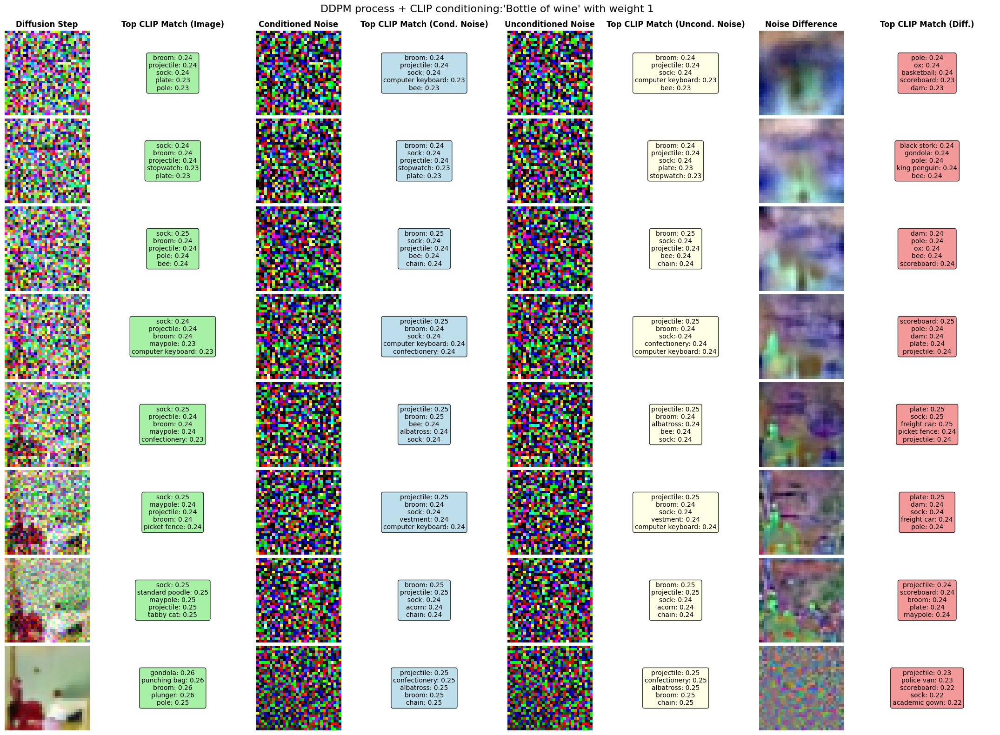

In [25]:
import warnings
warnings.filterwarnings('ignore', category=UserWarning, module='matplotlib')

# Test the diffusion visualization function
visualize_diffusion_process(
    ddpm=ddpm,
    model=model,
    clip_model=clip_model,
    clip_preprocess=clip_preprocess,
    embed_size=CLIP_FEATURES,
    device=device,
    img_ch=IMG_CH,
    img_size=IMG_SIZE,
    timesteps_to_show=None,
    prompt= "Bottle of wine",
    w = 1,
    top_k = 5,
    vocabulary = 'tinyimagenet'  
);

---

## 8. Explainable AI Analysis: Interpreting the Role of Noise

This is the core analytical section where we apply xAI techniques to understand **how noise encodes semantic information** and **which denoising steps matter most**.

### 8.1 Visualizing the Denoising Trajectory

The `visualize_diffusion_process` function reveals the step-by-step transformation from noise to image:

**Parameters**:
- `timesteps_to_show`: Which timesteps to display (None = automatic selection of key moments)
- `prompt`: Text description to guide generation
- `w`: Guidance weight (controls strength of text conditioning)
- `top_k`: Number of most critical denoising steps to highlight

**What We Can Learn**:

1. **When does semantic structure emerge?** 
   - Early timesteps (high noise): Global structure and composition
   - Middle timesteps: Object shapes and boundaries
   - Late timesteps (low noise): Fine details and textures

2. **How does guidance weight affect noise interpretation?**
   - Compare noise predictions at different `w` values
   - Observe how stronger guidance changes the trajectory

3. **Which timesteps are most critical?**
   - Identify the `top_k` steps with largest changes
   - These are where the model makes key "decisions" about content

**xAI Insight**: By visualizing the denoising process, we make the model's behavior transparent. We can see exactly when and how text conditioning influences noise removal.

### 8.2 Quantifying the Effect of Guidance Weight

Now we systematically test how guidance strength affects generation. The model generates images at **multiple guidance weights** simultaneously, allowing direct comparison.

**Experiment Design**:
- Same text prompts, different `w` values
- Observe how guidance weight changes noise prediction
- Compare visual quality and semantic alignment

**What Different Weights Mean**:

| Weight | Effect | Use Case |
|--------|--------|----------|
| w < 0 | Pushes **toward** unconditional (more random) | Exploring model's "imagination" |
| w = 0 | Standard conditional generation | Balanced generation |
| w = 1 | Moderate guidance | Good quality-diversity tradeoff |
| w = 2 | Strong guidance | High fidelity to prompt |
| w > 2 | Very strong guidance | May reduce diversity/naturalness |

**xAI Analysis Questions**:
- At what `w` do images best match the prompt?
- Is there a "sweet spot" for your use case?
- How does quality degrade with extreme `w` values?
- Can you identify visual artifacts from over-guidance?

Try different prompts and observe how the model's interpretation of noise changes with guidance strength.

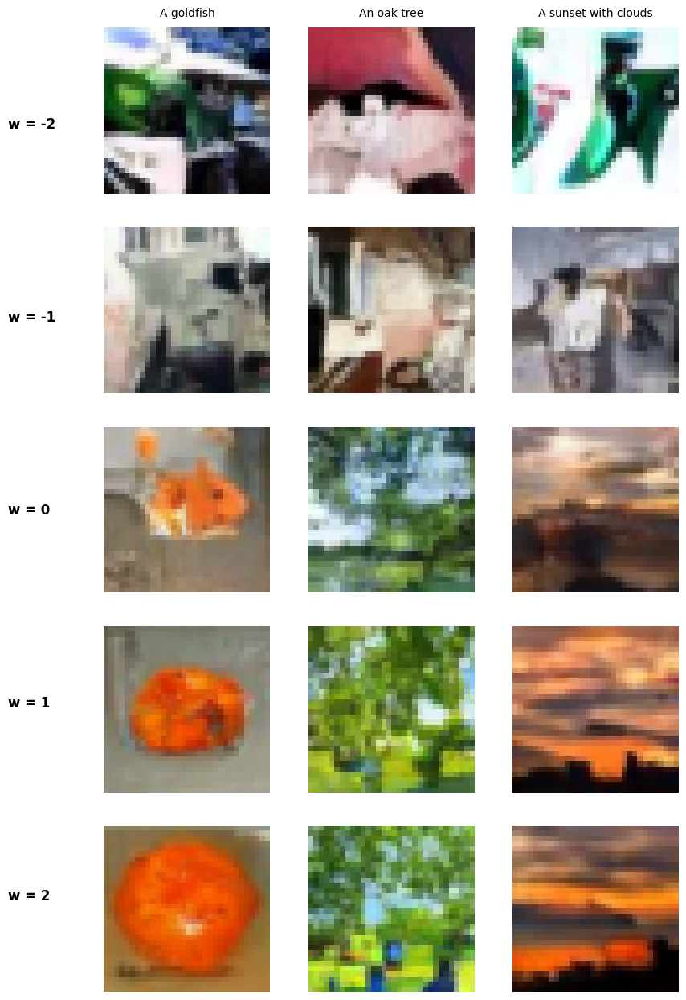

In [26]:
# Change me
text_list = [
    "A goldfish",
    "An oak tree",
    "A sunset with clouds"
]

# Define the w values that your model uses
w_values = [-2, -1, 0, 1, 2]  # or whatever w values your model actually generates

model.eval()
x_gen, x_gen_store = sample_tinyimg(text_list, w_values)

# Pass individual images instead of the grid
fig = generation_image(x_gen, text_list, w=w_values)
display(fig)

### 8.3 Animating the Noise-to-Image Transformation

Create animations showing the complete denoising trajectory. This visualization is crucial for understanding:

**What the Animation Reveals**:
1. **Noise structure evolution**: Watch how random noise develops semantic meaning
2. **Critical timesteps**: Identify when major structural decisions are made
3. **Guidance effects**: See how different `w` values change the path through noise space

**xAI Value**: The animation makes the entire generation process transparent, showing that images emerge gradually through learned noise removal, not "magic."

In [27]:
# Generate figures and save as animation (save_animation handles the conversion)
grids = [generation_image(x_gen.cpu(), text_list, w=w_values) for x_gen in x_gen_store]
save_animation(grids, "../images/test.gif")

Animation saved to: ../images/test.gif


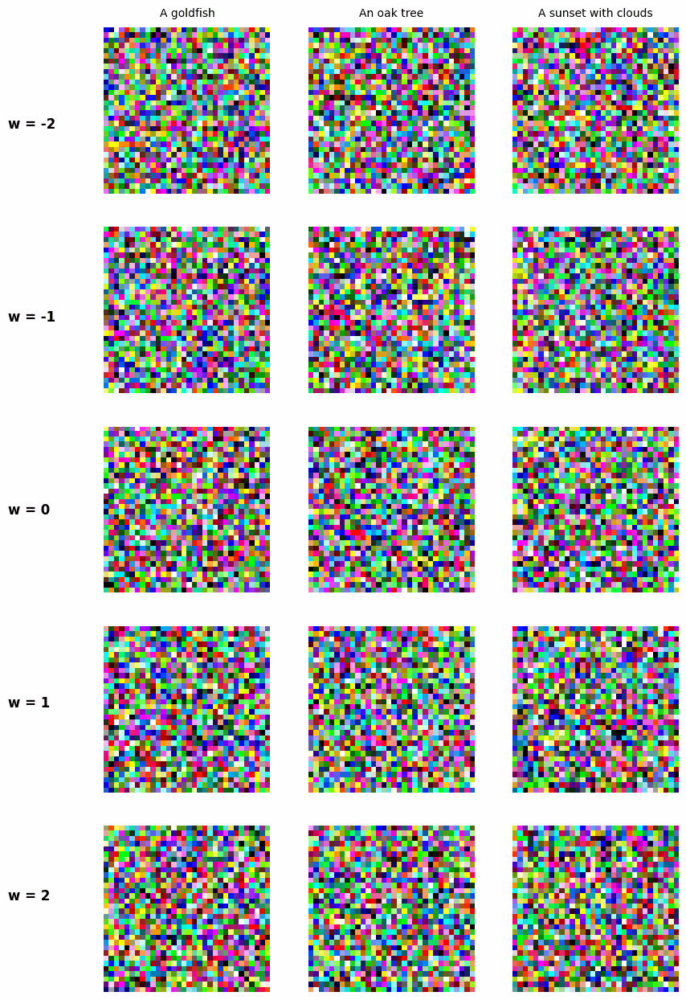

In [28]:
from IPython.display import Image, display
display(Image(filename="../images/test.gif"))

---

## 9. Conclusions: What We Learned About Noise

### The Central Finding: Noise is Structured and Interpretable

Through this notebook, we've demonstrated that **noise in diffusion models is not random** in the traditional sense. Instead:

**Key Insights from Our Analysis**:

1. **Noise Encodes Semantic Information**
   - The model learns that different noise patterns correspond to different visual content
   - CLIP conditioning changes these patterns in interpretable ways
   - We can visualize and quantify these changes through classifier-free guidance

2. **Timesteps Have Different Roles**
   - Early timesteps: Establish global structure (composition, layout)
   - Middle timesteps: Define semantic content (what objects are present)
   - Late timesteps: Refine details (texture, edges)
   - Our `top_k` analysis identifies which steps are most critical

3. **Guidance Weight Controls Semantic Strength**
   - $w$ acts as a "confidence" parameter for text conditioning
   - The difference $\Delta\epsilon = \epsilon_\theta(x_t, c) - \epsilon_\theta(x_t, \emptyset)$ quantifies semantic signal
   - We can tune $w$ based on desired quality-diversity tradeoff

### Explainable AI Contributions

This notebook demonstrates several xAI techniques for diffusion models:

✅ **Visualization**: Making the denoising process observable through animations  
✅ **Quantification**: Measuring the effect of guidance on noise prediction  
✅ **Interpretation**: Understanding when and how semantic structure emerges  
✅ **Comparison**: Analyzing conditional vs unconditional noise patterns  

**The Big Picture**: Diffusion models work by learning structured noise patterns. By understanding these patterns, we can:
- Diagnose when and why generation fails
- Optimize guidance parameters for specific use cases
- Develop better architectures that separate different noise components

### Limitations and Caveats

**Current Limitations**:
- 32x32 resolution limits visual analysis detail
- Training dataset size affects generalization
- Computational cost limits extensive hyperparameter exploration

**Interpretability Challenges**:
- Noise patterns in high-dimensional space are hard to visualize directly
- The relationship between CLIP embeddings and noise is non-linear
- Different prompts may require different guidance weights

### Future Directions

0. **Different dataset and benchmark**
   - Use higher resolution images or different datasets
   - Benchmark the model performance to see if good enough

1. **Noise Pattern Analysis**
   - Cluster and categorize learned noise patterns
   - Identify which patterns correspond to which visual features
   - Develop metrics for "noise interpretability"

2. **Timestep Attribution**
   - Quantify the contribution of each timestep to final quality
   - Develop adaptive sampling strategies based on importance
   - Create "counterfactual" generations by modifying key timesteps

3. **Conditioning Mechanisms**
   - Compare different ways of incorporating CLIP embeddings
   - Analyze which U-Net layers are most affected by conditioning
   - Study how different guidance formulations change noise prediction

4. **Proposals ?**
   - Anything else to propose as alternative?

### Related Work and Resources

**Diffusion Models**:
- [Denoising Diffusion Probabilistic Models (Ho et al., 2020)](https://arxiv.org/abs/2006.11239) - Foundational DDPM paper
- [Understanding Diffusion Models (Luo, 2022)](https://arxiv.org/abs/2208.11970) - Mathematical overview

**Text-to-Image Systems**:
- [Stable Diffusion (Rombach et al., 2022)](https://arxiv.org/abs/2112.10752) - Latent diffusion for high-resolution generation
- [DALL-E 2 (Ramesh et al., 2022)](https://arxiv.org/abs/2204.06125) - OpenAI's text-to-image system
- [Imagen (Saharia et al., 2022)](https://arxiv.org/abs/2205.11487) - Google's approach using T5

**Explainability**:
- [Classifier-Free Diffusion Guidance (Ho & Salimans, 2022)](https://arxiv.org/abs/2207.12598) - The guidance technique we analyzed
- [Diffusion Models Tutorial (Hugging Face)](https://huggingface.co/blog/annotated-diffusion) - Practical implementation guide
